# **Identification of Functional Connections in the Alzheimer’s APP Protein to Protein Interactome**

In [ ]:
!apt install python3-venv

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
python3-venv is already the newest version (3.10.6-1~22.04).
0 upgraded, 0 newly installed, 0 to remove and 10 not upgraded.


In [ ]:
!python3 -m venv Alzheimers
!source Alzheimers/bin/activate


In [ ]:
# Import packages for network analysis
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# import dataset
df = pd.read_excel('/content/drive/MyDrive/Alzheimers/output (1).xlsx')
print(df)

      Molecule A Molecule B                             Host Organism  \
0        ASPSCR1        VCP  Saccharomyces cerevisiae (Baker's yeast)   
1        ASPSCR1        VCP  Saccharomyces cerevisiae (Baker's yeast)   
2        ASPSCR1        VCP  Saccharomyces cerevisiae (Baker's yeast)   
3         NSFL1C        VCP  Saccharomyces cerevisiae (Baker's yeast)   
4         NSFL1C        VCP  Saccharomyces cerevisiae (Baker's yeast)   
...          ...        ...                                       ...   
55578       MAPT     ZC3H15                       Homo sapiens neuron   
55579       MAPT     ZNF706                       Homo sapiens neuron   
55580       MAPT     ZNF706                       Homo sapiens neuron   
55581       MAPT     ZNF706                       Homo sapiens neuron   
55582       MAPT     ZNF785                       Homo sapiens neuron   

           Detection Method      Interaction Type Interaction AC  \
0          two hybrid array  physical association   EBI

In [ ]:
# Check for null values
df.isnull().sum()

Molecule A          0
Molecule B          0
Host Organism       0
Detection Method    0
Interaction Type    0
Interaction AC      0
Confidence Value    0
dtype: int64

In [ ]:
# Drop the column 'Interaction AC' which is for use only to trace the identified functional interactions for further studies
dataframe = df.drop('Interaction AC', axis=1)

In [ ]:
# Drop duplicate data
data_frame = dataframe.drop_duplicates().reset_index(drop=True)
print(data_frame)

      Molecule A Molecule B                             Host Organism  \
0        ASPSCR1        VCP  Saccharomyces cerevisiae (Baker's yeast)   
1        ASPSCR1        VCP  Saccharomyces cerevisiae (Baker's yeast)   
2        ASPSCR1        VCP  Saccharomyces cerevisiae (Baker's yeast)   
3         NSFL1C        VCP  Saccharomyces cerevisiae (Baker's yeast)   
4         NSFL1C        VCP  Saccharomyces cerevisiae (Baker's yeast)   
...          ...        ...                                       ...   
47354       MAPT      YARS1                       Homo sapiens neuron   
47355       MAPT     YTHDF1                       Homo sapiens neuron   
47356       MAPT     ZC3H15                       Homo sapiens neuron   
47357       MAPT     ZNF706                       Homo sapiens neuron   
47358       MAPT     ZNF785                       Homo sapiens neuron   

           Detection Method      Interaction Type  Confidence Value  
0          two hybrid array  physical association    

In [ ]:
# Plot a graph of the network using plotly
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go

G = nx.Graph()

for _, row in df.iterrows():
    source_node = row['Molecule A']
    target_node = row['Molecule B']
    weight = row['Confidence Value']


    # Add nodes
    G.add_node(source_node)
    G.add_node(target_node)

    # Add the edges between source and target nodes
    G.add_edge(source_node, target_node, weight=weight)

# Create a Plotly graph object
pos = nx.spring_layout(G)
edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])
node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        )
    )
)

for node in G.nodes():
    x, y = pos[node]
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()

print("Number of nodes =", G.number_of_nodes())
print("Number of edges =", G.number_of_edges())





Number of nodes = 5751
Number of edges = 19208


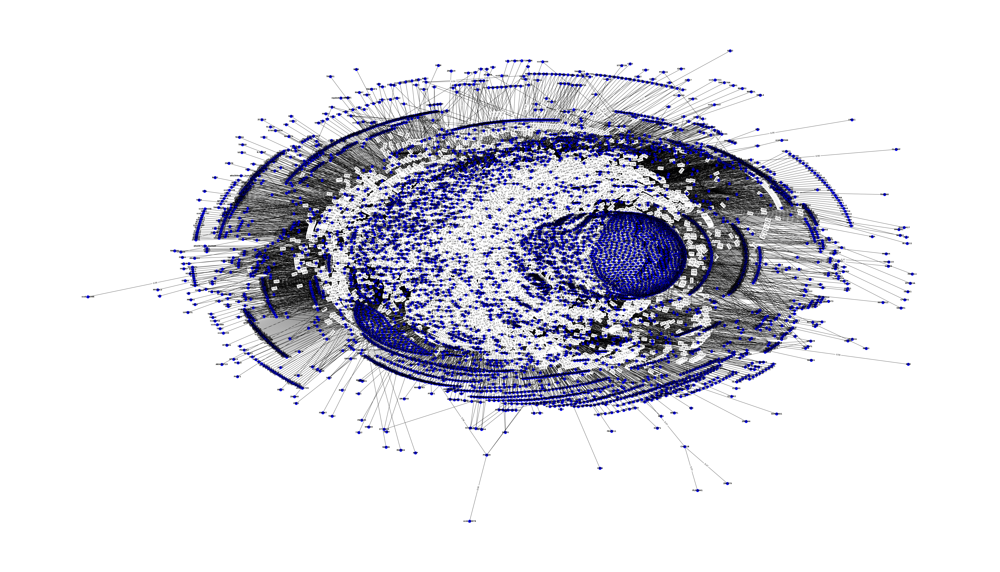

Number of nodes = 5751
Number of edges = 19208


In [ ]:
# Plot the network graph using another layout with matplotlib
plt.figure(figsize=(70, 40))
pos = nx.kamada_kawai_layout(G)
labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, pos, with_labels=True, node_size=200, node_color='blue', font_size=10, font_weight='bold')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.axis('off')
plt.show()

print("Number of nodes =", G.number_of_nodes())
print("Number of edges =", G.number_of_edges())

**Betweeness Centrality**

In [ ]:
# Create an object of the betweeenness centrality
bc = nx.betweenness_centrality(G)
nx.set_node_attributes(G, bc, "Betweennesscentrality")

plt.figure(figsize=(70, 40))
pos = nx.kamada_kawai_layout(G)

# Draw the graph with node colors based on betweenness centrality
node_colors = [G.nodes[node]["Betweennesscentrality"] for node in G.nodes]
edge_colors = "gray"

nx.draw(G, pos, node_color=node_colors, edge_color=edge_colors, with_labels=True, cmap=plt.cm.viridis)

# Add a color bar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label("Betweenness Centrality")

# Display the graph
plt.axis('off')
plt.show()

**Degree Centrality**

In [ ]:
# Create an object of the degree centrality
dc = nx.degree_centrality(G)
nx.set_node_attributes(G, dc, "Degree centrality")
d = dict(nx.degree(G))
nx.set_node_attributes(G, d, "Degree")

#Create layout
plt.figure(figsize=(50, 30))
pos = nx.random_layout(G)

# Define node colors and sizes
node_colors = [G.nodes[node]["Degree centrality"] for node in G.nodes]
node_sizes = [G.nodes[node]["Degree"] * 100 for node in G.nodes]
edge_colors = "gray"

# Draw the graph
nx.draw(G, pos, node_color=node_colors, node_size=node_sizes, edge_color=edge_colors, with_labels=True, cmap=plt.cm.viridis)

# Add color bar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label("Degree Centrality")

# Display the graph
plt.axis('off')
plt.show()


**Closeness Centrality**

In [ ]:
# Create an object of the closeness centrality
cc = nx.closeness_centrality(G)
nx.set_node_attributes(G, cc, "Closenesscentrality")

#Create layout
plt.figure(figsize=(50, 30))
pos = nx.spring_layout(G)

# Define node colors
node_colors = [G.nodes[node]["Closenesscentrality"] for node in G.nodes]
edge_colors = "gray"

# Draw the graph
nx.draw(G, pos, node_color=node_colors, node_size=node_sizes, edge_color=edge_colors, with_labels=True, cmap=plt.cm.viridis)

# Add color bar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label("Closenesscentrality")

# Display the graph
plt.axis('off')
plt.show()



**Eigenvector Centrality**

In [ ]:
# Create an object of the eigenvector centrality
ec = nx.eigenvector_centrality(G)
nx.set_node_attributes(G, ec, "Eigenvectorcentrality")

#Create layout
plt.figure(figsize=(50, 30))
pos = nx.kamada_kawai_layout(G)

# Define node colors and sizes
node_colors = [G.nodes[node]["Eigenvectorcentrality"] for node in G.nodes]
edge_colors = "gray"

# Draw the graph
nx.draw(G, pos, node_color=node_colors, node_size=node_sizes, edge_color=edge_colors, with_labels=True, cmap=plt.cm.viridis)

# Add color bar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label("Eigenvectorcentrality")

# Display the graph
plt.axis('off')
plt.show()


In [ ]:
# Create a DataFrame from the centrality measures
centrality_measures = pd.DataFrame.from_dict({
    'Closeness Centrality': cc,
    'Degree Centrality': dc,
    'Betweenness Centrality': bc,
    'Eigenvector Centrality': ec
})
centrality_measures.index.name = 'ID'
print(centrality_measures)


         Closeness Centrality  Degree Centrality  Betweenness Centrality  \
ID                                                                         
ASPSCR1              0.287759           0.000348                0.000009   
VCP                  0.381958           0.004522                0.004165   
NSFL1C               0.344332           0.000522                0.000006   
S100B                0.361362           0.005217                0.001264   
CBX5                 0.345761           0.003304                0.001015   
...                       ...                ...                     ...   
XPO7                 0.327151           0.000174                0.000000   
XRCC5                0.327151           0.000174                0.000000   
YTHDF1               0.327151           0.000174                0.000000   
ZC3H15               0.327151           0.000174                0.000000   
ZNF706               0.327151           0.000174                0.000000   

         Ei

In [ ]:
# Save the centrality measures as excel
centrality_measures.to_excel('centrality_measures.xlsx', index=True)

In [ ]:

d_c = centrality_measures['Degree Centrality']
d_c_sorted = d_c.sort_values(ascending=False)

#  Display the DataFrame for the top 20
print(d_c_sorted.head(20))

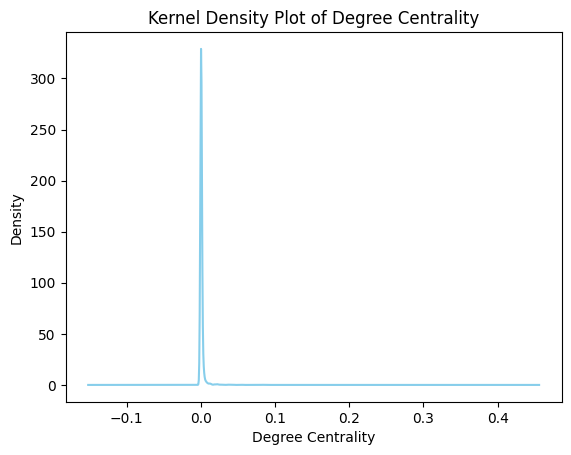

In [ ]:
# Create a density plot of the degree distribution
d_c_sorted.plot(kind='kde', color='skyblue')
plt.title('Kernel Density Plot of Degree Centrality')
plt.xlabel('Degree Centrality')
plt.show()

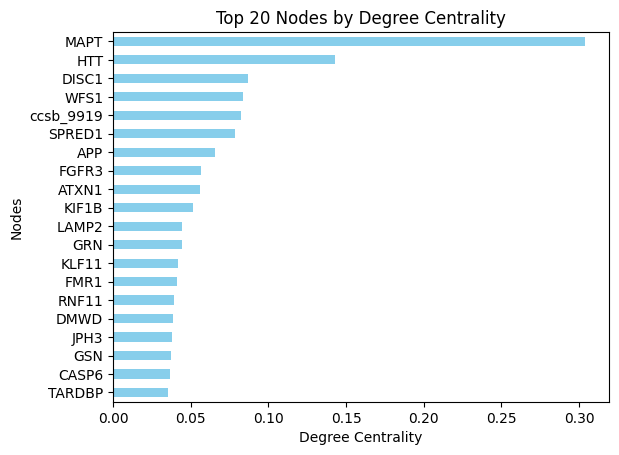

In [ ]:
# Create an horizontal bar chart of of the top 20 proteins by degree centrality
top_20 = d_c_sorted.head(20)[::-1]

top_20.plot(kind='barh', color='skyblue')
plt.xlabel('Degree Centrality')
plt.ylabel('Nodes')
plt.title('Top 20 Nodes by Degree Centrality')
plt.show()

In [ ]:
c_c = centrality_measures['Closeness Centrality']
c_c_sorted = c_c.sort_values(ascending=False)

# Display the DataFrame
print(c_c_sorted.head(20))

ID
MAPT       0.486176
APP        0.442853
NEFL       0.421492
HTT        0.410304
GFAP       0.410187
AP2B1      0.409194
PRKN       0.407368
OTUB1      0.407310
BRK1       0.406246
PPP1R21    0.406131
DNM2       0.402943
STXBP1     0.400278
EIF3F      0.399917
NEBL       0.398310
SNCA       0.398062
HNRNPK     0.397841
OPTN       0.395026
RAN        0.395026
PKM        0.394160
VDAC2      0.393351
Name: Closeness Centrality, dtype: float64


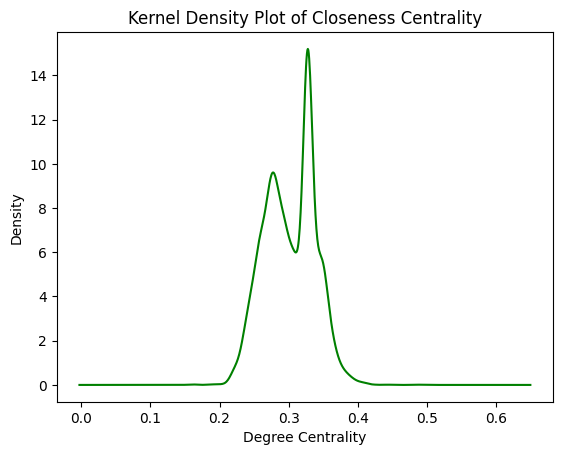

In [ ]:
# Create a density plot of the closeness distribution
c_c_sorted.plot(kind='kde', color='green')
plt.title('Kernel Density Plot of Closeness Centrality')
plt.xlabel('Degree Centrality')
plt.show()

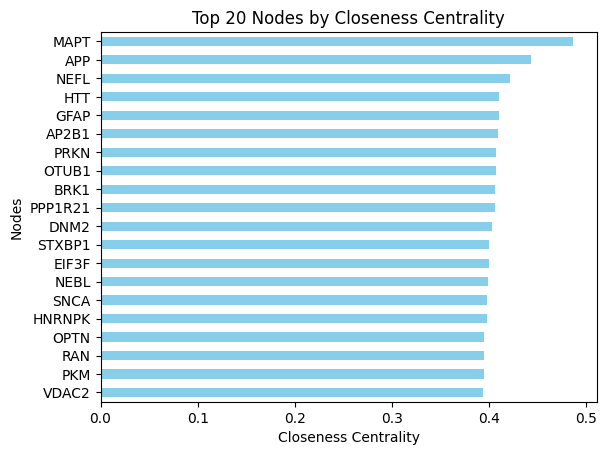

In [ ]:
# Create an horizontal bar chart of of the top 20 proteins by closeness centrality
top_20 = c_c_sorted.head(20)[::-1]

top_20.plot(kind='barh', color='skyblue')
plt.xlabel('Closeness Centrality')
plt.ylabel('Nodes')
plt.title('Top 20 Nodes by Closeness Centrality')
plt.show()

In [ ]:
b_c = centrality_measures['Betweenness Centrality']
b_c_sorted = c_c.sort_values(ascending=False)

# Display the DataFrame
print(b_c_sorted)

ID
MAPT          0.486176
APP           0.442853
NEFL          0.421492
HTT           0.410304
GFAP          0.410187
                ...   
SARS2         0.201549
CHAF1B        0.191157
ccsb_13674    0.186840
PLEKHH1       0.160485
ZNF879        0.160485
Name: Closeness Centrality, Length: 5751, dtype: float64


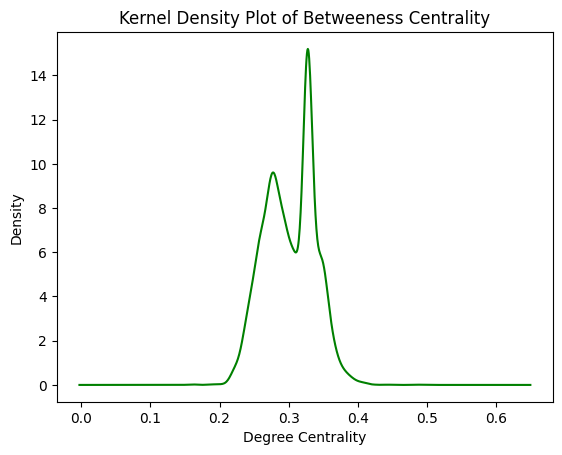

In [ ]:
# Create a density plot of the betweenness distribution
b_c_sorted.plot(kind='kde', color='green')
plt.title('Kernel Density Plot of Betweeness Centrality')
plt.xlabel('Degree Centrality')
plt.show()

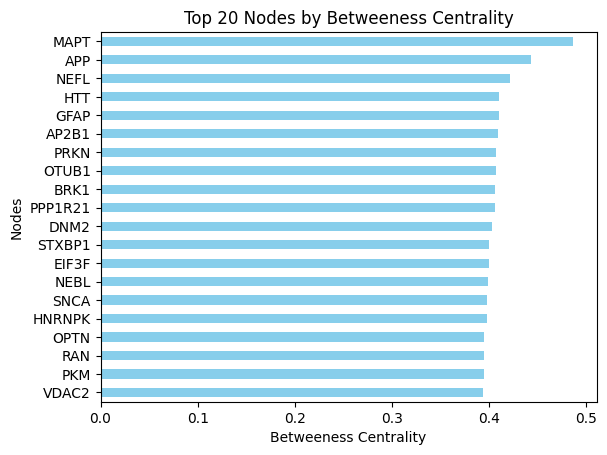

In [ ]:
# Create an horizontal bar chart of of the top 20 proteins by betweenness centrality
top_20 = b_c_sorted.head(20)[::-1]

top_20.plot(kind='barh', color='skyblue')
plt.xlabel('Betweeness Centrality')
plt.ylabel('Nodes')
plt.title('Top 20 Nodes by Betweeness Centrality')
plt.show()

In [ ]:
e_c = centrality_measures['Eigenvector Centrality']
e_c_sorted = c_c.sort_values(ascending=False)

# Display the DataFrame
print(e_c_sorted)

ID
MAPT          0.486176
APP           0.442853
NEFL          0.421492
HTT           0.410304
GFAP          0.410187
                ...   
SARS2         0.201549
CHAF1B        0.191157
ccsb_13674    0.186840
PLEKHH1       0.160485
ZNF879        0.160485
Name: Closeness Centrality, Length: 5751, dtype: float64


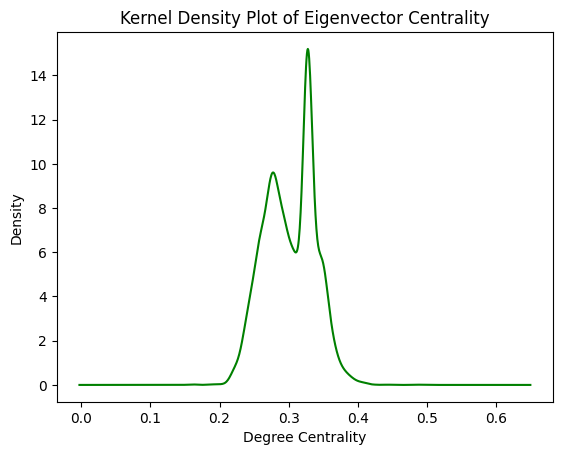

In [ ]:
# Create a density plot of the eigenvector distribution
e_c_sorted.plot(kind='kde', color='green')
plt.title('Kernel Density Plot of Eigenvector Centrality')
plt.xlabel('Degree Centrality')
plt.show()

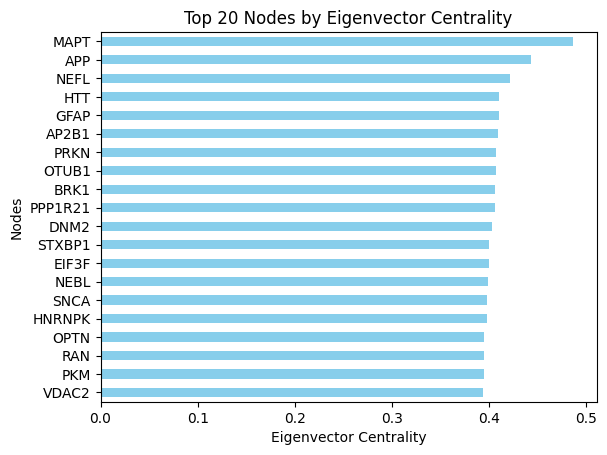

In [ ]:
# Create an horizontal bar chart of of the top 20 proteins by eigenvector centrality
top_20 = e_c_sorted.head(20)[::-1]

top_20.plot(kind='barh', color='skyblue')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Nodes')
plt.title('Top 20 Nodes by Eigenvector Centrality')
plt.show()

**Graph of Alzheimer's Protein-to-Protein Interactome Highlighting Functional Connections Within the Network**

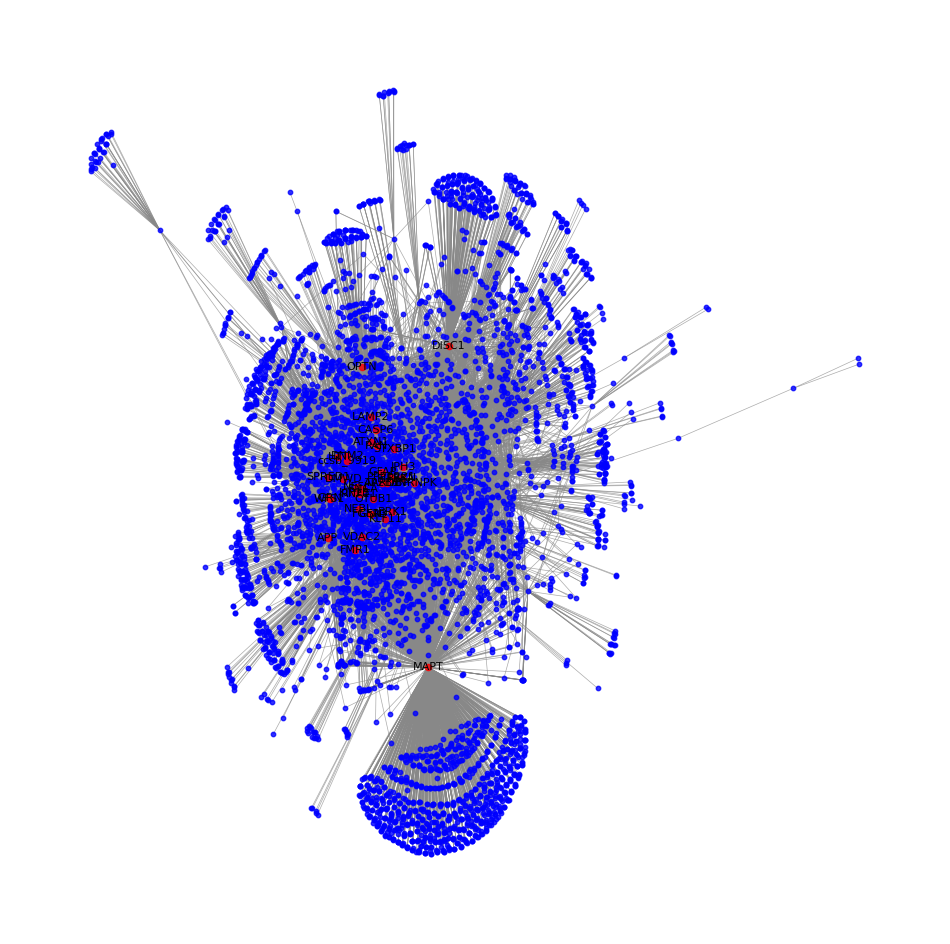

Number of nodes = 5751
Number of edges = 19208


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

G = nx.Graph()

for _, row in df.iterrows():
    source_node = row['Molecule A']
    target_node = row['Molecule B']
    weight = row['Confidence Value']

    # Addition of nodes
    G.add_node(source_node)
    G.add_node(target_node)

    # Addition of edges
    G.add_edge(source_node, target_node, weight=weight)

# Highlight identified nodes
highlighted_nodes = ['MAPT', 'APP', 'NEFL', 'HTT', 'GFAP', 'AP2B1', 'PRKN', 'OTUB1', 'BRK1', 'PPP1R21', 'DNM2', 'STXBP1', 'EIF3F', 'NEBL', 'SNCA', 'HNRNPK', 'OPTN', 'RAN', 'VDAC2', 'DISC1', 'WFS1', 'ccsb_9919', 'SPRED1', 'FGFR3', 'ATXN1', 'KIF1B', 'LAMP2', 'GRN', 'KLF11', 'FMR1', 'RNF11', 'DMWD', 'JPH3', 'GSN', 'CASP6', 'TARDBP']

# Create positions for the nodes
pos = nx.spring_layout(G)

# Draw the graph
plt.figure(figsize=(12, 12))

# Draw edges
nx.draw_networkx_edges(G, pos, edgelist=G.edges(), width=0.5, alpha=0.7, edge_color='#888')

# Draw nodes without labels
nx.draw_networkx_nodes(G, pos, nodelist=set(G.nodes()) - set(highlighted_nodes), node_size=10, node_color='blue', alpha=0.8)

# Highlight specific nodes
nx.draw_networkx_nodes(G, pos, nodelist=highlighted_nodes, node_size=20, node_color='red', alpha=0.8)

# Draw labels for highlighted nodes
labels = {node: node if node in highlighted_nodes else '' for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, font_color='black')

plt.axis('off')
plt.show()

print("Number of nodes =", G.number_of_nodes())
print("Number of edges =", G.number_of_edges())